In [71]:
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
import os
import cv2
from sklearn.model_selection import train_test_split
import numpy as np
import random
from PIL import Image
from tensorflow.keras.layers import Dense, Flatten, Conv2D
from tensorflow.keras import Model
from keras import metrics
import keras
from statistics import mode
from ipywidgets import widgets 
from IPython.display import display 

Source: https://www.kaggle.com/datasets/jehanbhathena/weather-dataset

## Photo processing

In [2]:
path = r'C:\projects\Weather-Classification\dataset'

In [3]:
#paths to file folders
path_next = []
for file in os.listdir(path):
    d = os.path.join(path, file)
    if os.path.isdir(d):
        path_next.append(d)

In [4]:
path_next

['C:\\projects\\Weather-Classification\\dataset\\dew',
 'C:\\projects\\Weather-Classification\\dataset\\fogsmog',
 'C:\\projects\\Weather-Classification\\dataset\\frost',
 'C:\\projects\\Weather-Classification\\dataset\\glaze',
 'C:\\projects\\Weather-Classification\\dataset\\hail',
 'C:\\projects\\Weather-Classification\\dataset\\lightning',
 'C:\\projects\\Weather-Classification\\dataset\\rain',
 'C:\\projects\\Weather-Classification\\dataset\\rainbow',
 'C:\\projects\\Weather-Classification\\dataset\\rime',
 'C:\\projects\\Weather-Classification\\dataset\\sandstorm',
 'C:\\projects\\Weather-Classification\\dataset\\snow']

In [5]:
#paths to all photos in the form of photo['type'][number]
photos = {}
for i in range(len(path_next)):
    lista = []
    for file in os.listdir(path_next[i]):
        d = os.path.join(path_next[i], file)
        lista.append(d)
    photos[path_next[i].split("\\")[-1]] = lista

In [6]:
#number of photos for a given weather condition
wea_num = []
for i in range(len(photos)):
    wea_num.append([path_next[i].split("\\")[-1], len(photos[path_next[i].split("\\")[-1]])])
wea_num

[['dew', 698],
 ['fogsmog', 851],
 ['frost', 475],
 ['glaze', 639],
 ['hail', 591],
 ['lightning', 377],
 ['rain', 526],
 ['rainbow', 232],
 ['rime', 1160],
 ['sandstorm', 692],
 ['snow', 621]]

In [7]:
#adding all photos
imgs = {}
for i in range(len(photos)):
    list_img = []
    for j in photos[path_next[i].split("\\")[-1]]:
        list_img.append(cv2.imread(j))
    imgs[path_next[i].split("\\")[-1]] = list_img
    print(i)

0
1
2
3
4
5
6
7
8
9
10


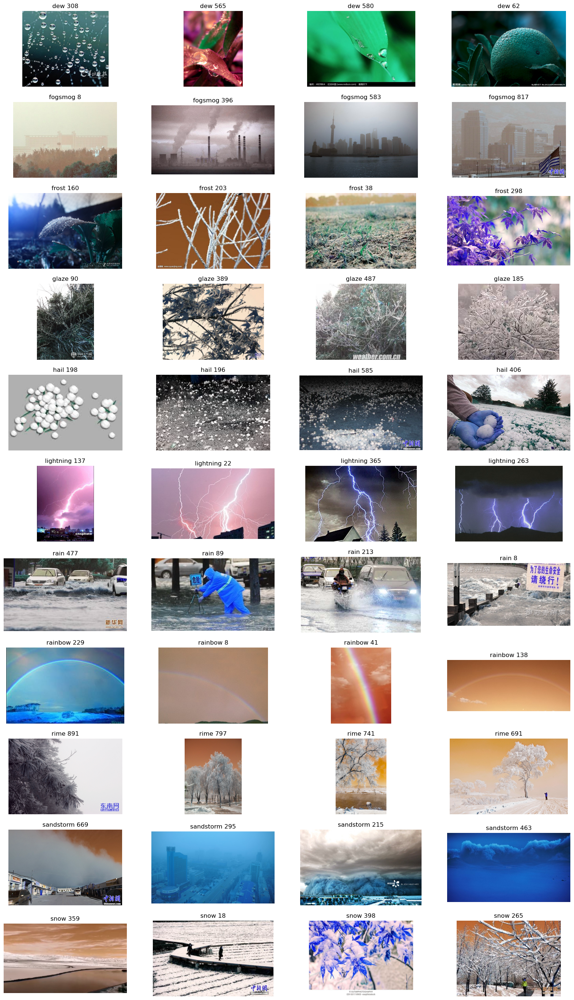

In [9]:
#sample pictures
fig = plt.figure(figsize=(20, 35))
for j in range(len(photos)):
    for i in range(4):
        fig.add_subplot(len(photos), 4, i+4*j+1)
        r = random.randint(1, wea_num[j][1])
        plt.imshow(imgs[path_next[j].split("\\")[-1]][r])
        plt.axis('off')
        plt.title(path_next[j].split("\\")[-1] + ' ' + str(r+1))

In [10]:
#checking which photos are not RGB
k = 0
for p in wea_num:
    for s in range(p[1]):
        im = imgs[p[0]][s]
        if im is not None:
            if im.shape[0] > 3000 and im.shape[1] > 3000:
                print(im.shape)
            if len(im.shape) != 3:
                print(p,s, im.shape)
                k=k+1
            elif len(im.shape) == 3 and im.shape[2] != 3:   #at this stage all images have a good shape
                print(p,s, im.shape)
                k=k+1
        else:
            print(p,s, 'None')
print(k)

['fogsmog', 851] 439 None
(3174, 4863, 3)
(3022, 3677, 3)
['snow', 621] 357 None
0


In [11]:
new_photo = []
for p in wea_num:
    for s in range(p[1]):
        image = Image.open(photos[p[0]][s])
        new_image = image.resize((100, 100))   #swapping images so that they are all square and have the same shape
        new_photo.append(np.array(new_image))

In [12]:
#out of 6862 photos, 174 have the wrong shape
photo_grey = []
photo_alpha = []
k = 0
for i, z in enumerate(new_photo):
    if len(z.shape) != 3:   #grey, 3rd dimension missing
        photo_grey.append([i, z])
        k=k+1
    elif len(z.shape) == 3 and z.shape[2] != 3:   #RGB-A - additional 4th channel in the 3rd dimension
        photo_alpha.append([i, z])
        k=k+1
print(k)

174


In [13]:
#repair of gray images - conversion to RGB
photo_grey_rgb = []
for s in photo_grey:
    photo_rgb = cv2.cvtColor(s[1], cv2.COLOR_GRAY2RGB)
    photo_grey_rgb.append([s[0], photo_rgb])

In [14]:
#repair of alpha images - conversion to RGB
photo_alpha_rgb = []
for a in photo_alpha:
    photo_rgb = np.array(Image.fromarray(np.uint8(a[1])).convert('RGB'))
    photo_alpha_rgb.append([a[0], photo_rgb])

In [15]:
new_photo2 = new_photo

In [16]:
#substituting RGB converted photos for gray photos
for i, j in enumerate(photo_grey_rgb):
    new_photo2[j[0]] = photo_grey_rgb[i][1]

In [17]:
#substituting RGB converted photos for alpha photos
for i, j in enumerate(photo_alpha_rgb):
    new_photo2[j[0]] = photo_alpha_rgb[i][1]

In [18]:
#checking whether all photos have the same dimensions - k should equal 0
k = 0
for i, z in enumerate(new_photo2):
    if len(z.shape) != 3:   #grey, 3rd dimension missing
        k=k+1
    elif len(z.shape) == 3 and z.shape[2] != 3:   #RGB-A - additional 4th channel in the 3rd dimension
        k=k+1
print(k)

0


In [19]:
#converting list to array
photo_array = np.array(new_photo2)

## LABELS

In [20]:
#extracting from labels, which are then converted into numerical values 0-10
#0 was added as the first element so that the append could be performed
labels_arr = np.array([np.array([0])])
for i in range(len(wea_num)):   
    for j in range(wea_num[i][1]):
        labels_arr = np.append(labels_arr, [np.array([i])], axis=0)   #label encoder
labels_arr

array([[ 0],
       [ 0],
       [ 0],
       ...,
       [10],
       [10],
       [10]])

In [21]:
#removing the first element
la = labels_arr[1:]
la

array([[ 0],
       [ 0],
       [ 0],
       ...,
       [10],
       [10],
       [10]])

In [22]:
#division into training and test set
x_train, x_test, y_train, y_test = train_test_split(photo_array, la, test_size=0.2, random_state=0)

In [23]:
#categorization, needed for CategoricalCrossentropy
y_train = tf.keras.utils.to_categorical(y_train, 11)
y_test = tf.keras.utils.to_categorical(y_test, 11)

## LEARNING

In [28]:
model = models.Sequential()  #Sequential model
model.add(layers.Conv2D(100, (3, 3), activation='relu', input_shape=(100, 100, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))    #2D convolution layer - spatial convolution in images
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))

In [29]:
model.add(layers.Flatten())       #flatten - flattens the input data
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(11))  #11 - number of labels

In [30]:
model.compile(optimizer='adam',
loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),    
              metrics=['accuracy', keras.metrics.Precision(), keras.metrics.Recall()])

In [31]:
history = model.fit(x_train, y_train, epochs=10, validation_data=(x_test, y_test))

Epoch 1/10
172/172 [==============================] - 77s 434ms/step - loss: 3.2641 - accuracy: 0.2037 - precision_2: 0.1669 - recall_2: 0.1006 - val_loss: 2.2350 - val_accuracy: 0.2418 - val_precision_2: 0.1605 - val_recall_2: 0.2739
Epoch 2/10
172/172 [==============================] - 72s 418ms/step - loss: 2.1305 - accuracy: 0.2928 - precision_2: 0.2128 - recall_2: 0.2494 - val_loss: 2.1158 - val_accuracy: 0.2964 - val_precision_2: 0.1913 - val_recall_2: 0.2935
Epoch 3/10
172/172 [==============================] - 71s 415ms/step - loss: 1.8722 - accuracy: 0.3686 - precision_2: 0.2279 - recall_2: 0.5475 - val_loss: 1.9662 - val_accuracy: 0.3139 - val_precision_2: 0.2244 - val_recall_2: 0.5055
Epoch 4/10
172/172 [==============================] - 72s 417ms/step - loss: 1.5610 - accuracy: 0.4899 - precision_2: 0.2343 - recall_2: 0.7318 - val_loss: 1.9189 - val_accuracy: 0.4144 - val_precision_2: 0.2129 - val_recall_2: 0.7269
Epoch 5/10
172/172 [==============================] - 70s 40

In [32]:
print(history.history['accuracy'][-1])

0.8072508573532104


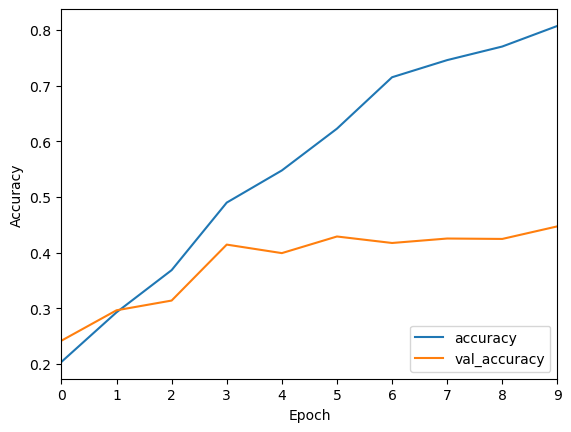

In [46]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.xlim([0, 9])
plt.legend(loc='lower right')

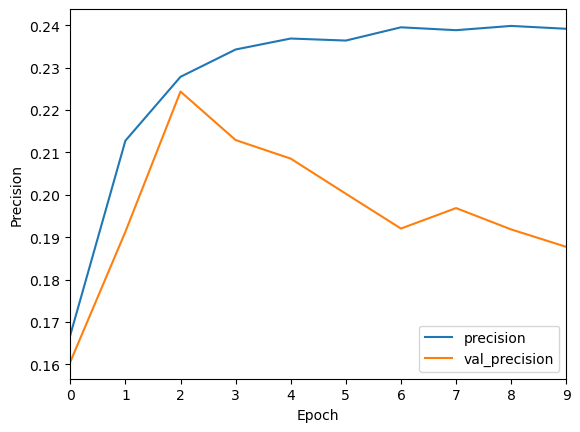

In [42]:
plt.plot(history.history['precision_2'], label='precision')
plt.plot(history.history['val_precision_2'], label = 'val_precision')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.xlim([0, 9])
plt.legend(loc='lower right')

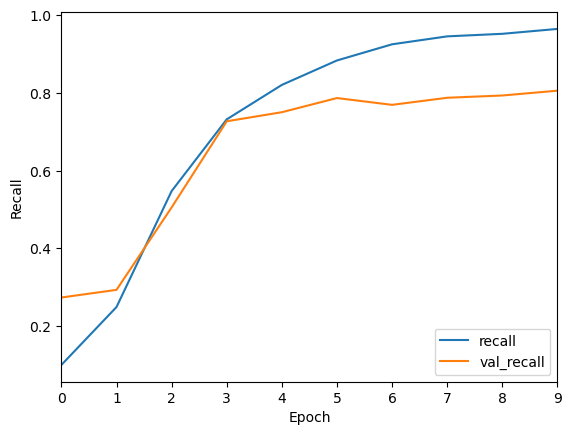

In [44]:
plt.plot(history.history['recall_2'], label='recall')
plt.plot(history.history['val_recall_2'], label = 'val_recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.xlim([0, 9])
plt.legend(loc='lower right')

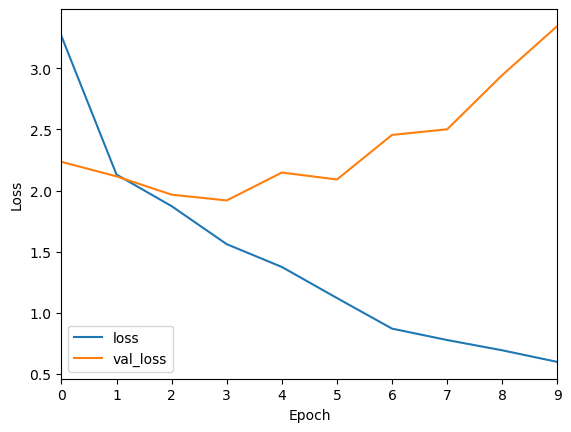

In [45]:
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label = 'val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xlim([0, 9])
plt.legend(loc='lower left')

In [47]:
#results obtained by the model
mp = model.predict(x_test)

43/43 [==============================] - 4s 100ms/step


## Comparison of real values to predicted values

In [57]:
s = 0
mistakes = []
real = []
predicted = []
for i in range(len(mp)):
    p = list(y_test[i]).index(1)
    k = list(mp[i]).index(max(mp[i]))
    if p != k:
        real.append(p)
        predicted.append(k)
        mistakes.append((p, k))
        s = s+1
print(s)

759


In [60]:
#the most frequently occurring value
mode_mis = mode(mistakes)
mode_mis

(9, 1)

In [61]:
mistakes.count(mode_mis)

55

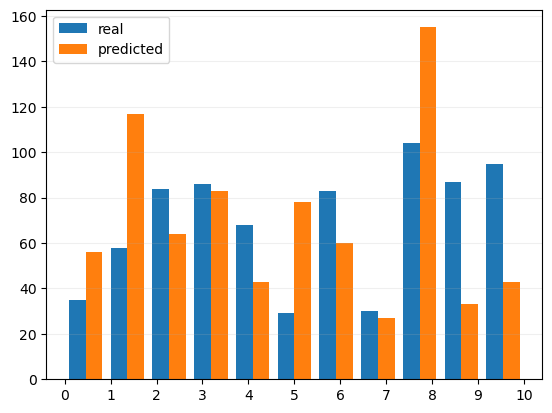

In [62]:
plt.hist([real, predicted], label=['real', 'predicted'], bins = 11)
plt.xticks(np.arange(11))
plt.legend()

plt.grid(axis='y', alpha=0.2)

## VOTING BY USERS

In [64]:
#combining all photos and labels
all_imgs = []
all_label = []
for i in range(len(imgs)):
    for j in range(len(imgs[wea_num[i][0]])):
        all_imgs.append(imgs[wea_num[i][0]][j])
        all_label.append(wea_num[i][0])

In [68]:
#drawing 20 random numbers
rand = []
for i in range(20):
    rand.append(random.randint(1, len(all_imgs)))

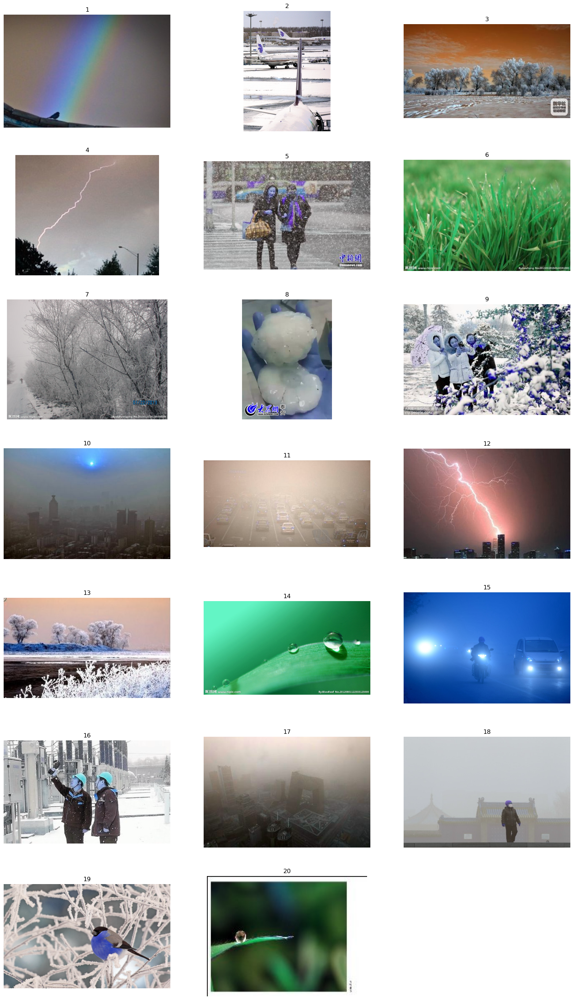

In [70]:
#rating the photo
fig = plt.figure(figsize=(20, 35))

for i in range(20):
    fig.add_subplot(7, 3, i+1)
    plt.imshow(all_imgs[rand[i]])
    plt.axis('off')
    plt.title(i+1)

In [86]:
classes = []
for i in wea_num:
    classes.append(i[0])

In [107]:
def onButtonClick(b):
    voting_results.append(b.description)
    print("Vote " + str(len(voting_results)) + '. '+ b.description)

In [116]:
voting_results = []
for i in range(11):
    button = widgets.Button(description=classes[i])
    display(button)
    button.on_click(onButtonClick)

Button(description='dew', style=ButtonStyle())

Button(description='fogsmog', style=ButtonStyle())

Button(description='frost', style=ButtonStyle())

Button(description='glaze', style=ButtonStyle())

Button(description='hail', style=ButtonStyle())

Button(description='lightning', style=ButtonStyle())

Button(description='rain', style=ButtonStyle())

Button(description='rainbow', style=ButtonStyle())

Button(description='rime', style=ButtonStyle())

Button(description='sandstorm', style=ButtonStyle())

Button(description='snow', style=ButtonStyle())

Vote 1. rainbow
Vote 2. snow
Vote 3. glaze
Vote 4. lightning
Vote 5. snow
Vote 6. frost
Vote 7. rime
Vote 8. hail
Vote 9. rime
Vote 10. fogsmog
Vote 11. sandstorm
Vote 12. lightning
Vote 13. glaze
Vote 14. dew
Vote 15. fogsmog
Vote 16. snow
Vote 17. fogsmog
Vote 18. fogsmog
Vote 19. frost
Vote 20. dew


In [142]:
res = 0
for i in range(20):
    print(i+1, voting_results[i], all_label[rand[i]])
    if voting_results[i] == all_label[rand[i]]:
        res = res + 1
print('Correct answers:', int(res/20*100), '%')

1 rainbow rainbow
2 snow snow
3 glaze rime
4 lightning lightning
5 snow snow
6 frost dew
7 rime rime
8 hail hail
9 rime snow
10 fogsmog fogsmog
11 sandstorm fogsmog
12 lightning lightning
13 glaze rime
14 dew dew
15 fogsmog sandstorm
16 snow snow
17 fogsmog fogsmog
18 fogsmog fogsmog
19 frost frost
20 dew dew
Correct answers: 70 %
